In [1]:
# Use Colab
from google.colab import drive
drive.mount("/content/gdrive")
%cd "/content/gdrive/Shareddrives/CV/FinalCV"
%ls

Mounted at /content/gdrive
/content/gdrive/Shareddrives/CV/FinalCV
data/                prior.jpg
Detect_Acne_DB/      __pycache__/
Detect_Acne.py       README.md
FaceDetection.ipynb  Result_acne_face.jpg
FaceDetection.py     Results/
faceMask.jpg         shape_predictor_68_face_landmarks.dat
Mask2.jpg            test.py
NewData/             Untitled.ipynb


In [2]:
%pip install imutils
%pip install pyclipper
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 603 kB 27.3 MB/s 


In [3]:
import cv2
import argparse
import ntpath
import os
import time
import matplotlib.pyplot as plt
import numpy as np
import imutils
from imutils.video import WebcamVideoStream
from imutils import face_utils
from Detect_Acne import *
import math

import time

In [4]:
# to detect face feature
import dlib
predictor_model = 'shape_predictor_68_face_landmarks.dat'
detector = dlib.get_frontal_face_detector()# dlib人脸检测器
predictor = dlib.shape_predictor(predictor_model)


In [5]:
def readFiles(path):
    img = cv2.imread(path)
    return img

In [6]:
# detectors = {
#     "eye": os.path.sep.join([ntpath.dirname(cv2.__file__), 'data', 'haarcascade_eye.xml']),
#     "face": os.path.sep.join([ntpath.dirname(cv2.__file__), 'data', 'haarcascade_frontalface_default.xml'])
# }
# def detect(gray, part="face"):
    
#     detector = cv2.CascadeClassifier(detectors[part])
#     rects = detector.detectMultiScale(gray, scaleFactor=2, minNeighbors=5, minSize=(15, 15),
#                                       flags=cv2.CASCADE_SCALE_IMAGE)
#     return rects

In [7]:
def img2Gray(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img, gray

In [8]:
def showImage(img):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
def skinDetection(img):
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    HSV_mask = cv2.inRange(img_HSV, (0, 15, 0), (17,170,255)) 
    HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

    #converting from gbr to YCbCr color space
    img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    #skin color range for hsv color space 
    YCrCb_mask = cv2.inRange(img_YCrCb, (0, 135, 85), (255,180,135)) 
    YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

    #merge skin detection (YCbCr and hsv)
    global_mask=cv2.bitwise_and(YCrCb_mask,HSV_mask)
    global_mask=cv2.medianBlur(global_mask,3)
    global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, np.ones((4,4), np.uint8))


    HSV_result = cv2.bitwise_not(HSV_mask)
    YCrCb_result = cv2.bitwise_not(YCrCb_mask)
    global_result=cv2.bitwise_not(global_mask)
    
    return global_result

In [10]:
def get_landmarks(Gimg):

    detector = dlib.get_frontal_face_detector()
    
    StartTime = time.time() # start time
    predictor = dlib.shape_predictor(predictor_model)
    
    print(time.time() - StartTime) # end time
    
    rects = detector(Gimg, 0)
    face = rects[0]
    
    shape = predictor(Gimg, face)
    shape = face_utils.shape_to_np(shape)

    
    landmarks = np.matrix([[p.x, p.y] for p in predictor(Gimg, face).parts()])
    for points in predictor(Gimg, face).parts():
        cv2.circle(Gimg, (points.x, points.y), 1, (0, 0, 255), 10)

    
    return face, landmarks


In [11]:

def getForeHead(landsmark):
    forehead = np.zeros([5,2], dtype = np.int)
    int_lmrks = np.array(landsmark, dtype=np.int)
    D_nose = abs(int_lmrks[27]-int_lmrks[30])
    print("D_nose : " + str(D_nose))
    L_eye = abs(int_lmrks[36][0] - int_lmrks[40][0])
    R_eye = abs(int_lmrks[42][0] - int_lmrks[45][0]) 
    
    leftEye = ((int_lmrks[36] + int_lmrks[39]) / 2)
    rightEye = ((int_lmrks[42] + int_lmrks[45]) / 2)
    centroidEye = ( (leftEye+rightEye) / 2)
    lineX = leftEye[0] - rightEye[0]
    lineY = leftEye[1] - rightEye[1]
    mag =  math.sqrt((lineX*lineX) + (lineY*lineY))
    
    lineX = lineX/mag
    lineY = lineY/mag
    
    VlineY = lineX
    VlineX = -lineY
    
    # diff from centroidEye to noise
    diff = (centroidEye - int_lmrks[30])
    length = math.sqrt((diff[0]*diff[0]+diff[1]*diff[1]))
    
    # diff from centroidEye to leftEye
    diffL = (centroidEye - int_lmrks[16])
    print("diffL" + str(diffL))
    lengthL = math.sqrt((diffL[0]*diffL[0]+diffL[1]*diffL[1]))

    # diff from centroidEye to rightEye
    diffR = (centroidEye - int_lmrks[0])
    print("diffR" + str(diffR))
    lengthR = math.sqrt((diffR[0]*diffR[0]+diffR[1]*diffR[1]))

    
    # normalize C

#     print("test")
#     print(int_lmrks[5][0])
#     print(int_lmrks[17])
#     print(int_lmrks[11])
#     print(int_lmrks[26])
#     print("test")
    C = 1
    # a 
    forehead[0] =  int_lmrks[0]

    # b
    forehead[1][0] =  round(centroidEye[0] + 2*length * VlineX + 0.8*lengthR * lineX)
    forehead[1][1] =  round(centroidEye[1] + 2*length * VlineY + 0.8*lengthR * lineY)
    print("lengthR : " + str(lengthR))
    
    # c
    forehead[2] =  int_lmrks[16]
    
    # d
    forehead[3][0] =  round(centroidEye[0] + 2*length * VlineX - 0.8*lengthL * lineX)
    forehead[3][1] =  round(centroidEye[1] + 2*length * VlineY - 0.8*lengthL * lineY)
    print("lengthL : " + str(lengthL))
    
    # e
    forehead[4][0] =  round(centroidEye[0] + 2.5*length * VlineX)
    forehead[4][1] =  round(centroidEye[1] + 2.5*length * VlineY)
    
    return forehead

2.193953037261963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review yo

D_nose : [  3 117]
diffL[-193.75   33.  ]
diffR[186.25  43.  ]
lengthR : 191.14931990462324
lengthL : 196.54023125049997
(5, 2)
[192 292]
[232 103]
[572 302]
[542 111]
[386  50]


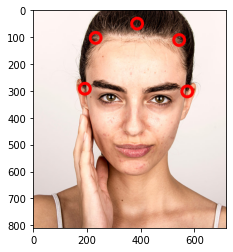

In [12]:
Origin_img = cv2.imread('data/t4.jpg')
img, Gimg = img2Gray(Origin_img)
face, landmarks = get_landmarks(Gimg)
result = getForeHead(landmarks)
print(result.shape)
for points in result:
    print(points)
    cv2.circle(img, (points[0], points[1]), 20, (0, 0, 255), 10)
    
int_lmrks = np.array(landmarks, dtype=np.int)
showImage(img)

In [13]:
def GetSkinMask(img):
    # find skin region, 0 is skin, otherwise is 1
    SkinImage = skinDetection(img)
    skinMask = np.zeros_like(img)
    skinMask[SkinImage[:,:] == 0] = (255,255,255)
    skinMask[SkinImage[:,:] == 1] = (0, 0, 0)
    
    return skinMask


In [14]:
#%pip install pyclipper
import pyclipper

def perimeter(poly):
    p = 0
    nums = poly.shape[0]
    for i in range(nums):
        p += abs(np.linalg.norm(poly[i % nums] - poly[(i + 1) % nums]))
    return p

def proportional_zoom_contour(contour, ratio):
    """
    多边形轮廓点按照比例进行缩放
    :param contour: 一个图形的轮廓格式[[[x1, x2]],...],shape是(-1, 1, 2)
    :param ratio: 缩放的比例，如果大于1是放大小于1是缩小
    :return:
    """
    poly = contour[:, :]
    area_poly = abs(pyclipper.Area(poly))
    perimeter_poly = perimeter(poly)
    poly_s = []
    pco = pyclipper.PyclipperOffset()
    pco.MiterLimit = 10
    if perimeter_poly:
        d = area_poly * (1 - ratio * ratio) / perimeter_poly
        pco.AddPath(poly, pyclipper.JT_MITER, pyclipper.ET_CLOSEDPOLYGON)
        poly_s = pco.Execute(-d)
    poly_s = np.array(poly_s).reshape(-1, 1, 2).astype(int)

    return poly_s

def get_image_hull_mask(img, image_landmarks, ie_polys=None):
    # get the mask of the image
#     if image_landmarks.shape[0] != 68:
#         raise Exception(
#             'get_image_hull_mask works only with 68 landmarks')



    
    
    int_lmrks = np.array(image_landmarks, dtype=np.int)
    #hull_mask = np.zeros(image_shape[0:2]+(1,), dtype=np.float32)
    hull_mask = np.zeros_like(img)

    
    forehead = getForeHead(image_landmarks)
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(forehead), (255,255,255))
    
    
    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[0:9],
                        int_lmrks[17:18]))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[8:17],
                        int_lmrks[26:27]))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[17:20],
                        int_lmrks[8:9]))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[24:27],
                        int_lmrks[8:9]))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[19:25],
                        int_lmrks[8:9],
                        ))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[17:22],
                        int_lmrks[27:28],
                        int_lmrks[31:36],
                        int_lmrks[8:9]
                        ))), (255,255, 255))

    cv2.fillConvexPoly(hull_mask, cv2.convexHull(
        np.concatenate((int_lmrks[22:27],
                        int_lmrks[27:28],
                        int_lmrks[31:36],
                        int_lmrks[8:9]
                        ))), (255,255, 255))
#     cv2.fillConvexPoly(hull_mask, cv2.convexHull(
#                         int_lmrks[68:81]), (255,255, 255))

    nose = proportional_zoom_contour(int_lmrks[27:36], 1.2)
    l_eyes = proportional_zoom_contour(int_lmrks[36:42], 1.8)
    r_eyes = proportional_zoom_contour(int_lmrks[42:48], 1.8)
    mouse = proportional_zoom_contour(int_lmrks[48:60], 1.3)
    
    l_brow = proportional_zoom_contour(int_lmrks[17:22], 1.4)
    r_brow = proportional_zoom_contour(int_lmrks[22:27], 1.4)
    
    
    #face
    for i in range(17-3):
        cv2.fillConvexPoly(
            hull_mask, int_lmrks[i:i+3], (0,0, 0))
        
    # nose
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(nose), (0,0, 0))
    # left eyes
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(l_eyes), (0,0, 0))
    # right eyes
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(r_eyes), (0,0, 0))
    # mouse 
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(mouse), (0,0, 0))
    
    #brow
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(l_brow), (0,0, 0))
    cv2.fillConvexPoly(
        hull_mask, cv2.convexHull(r_brow), (0,0, 0))
    

    

    return hull_mask

In [15]:
if __name__ == "__main__" and False:
    
    #Read Image
    Origin_img = cv2.imread('data/t2.jpg')
    Origin_img = imutils.resize(Origin_img, width=600)
    img = Origin_img.copy()
    
    img,Gimg = img2Gray(img)
    
#     # Method 1 to get face (Skin Detection and Face Detection(Harr))
#     skinMask = GetSkinMask(img)
#     faceMask = GetFaceMask(img)
#     # combine two mask
#     Face_Skin_Mask = cv2.bitwise_and(skinMask, faceMask)
#     img = cv2.bitwise_and(Face_Skin_Mask, img)
#     # can't cut out only face in result

    # Method 2 to get face (Use Dlib)
#     SkinMask = GetSkinMask(img)
    face, landmarks = get_landmarks(Gimg)
    faceMask = get_image_hull_mask(img, landmarks)
    img = cv2.bitwise_and(faceMask, img)
    cv2.imwrite("faceMask.jpg", img)
    showImage(img)
#     img = cv2.bitwise_and(SkinMask, img)
    # not a good method, which cost 1.55 sec

    
#     img = cv2.imread('./data/acne.jpg')
    ad = Acne_Dector(img)
    ad.run(method =1, debug=False)
    img = cv2.inpaint(Origin_img, ad.mask, 3, cv2.INPAINT_TELEA)
    showImage(ad.mask)
    cv2.imwrite("Result_acne_face.jpg", img)
    cv2.imwrite("Mask2.jpg", ad.mask)
    

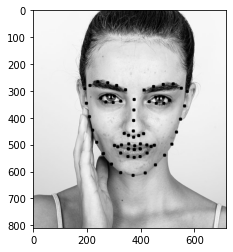

In [16]:
showImage(Gimg)

In [17]:
# heightResize = 480
# framesSkipping = 1

# cameraObject = cv2.VideoCapture(0)
# ret, image = cameraObject.read()
# height = image.shape[0]

# frame_resize_scale = float(height)/heightResize
# modelPath = "shape_predictor_81_face_landmarks.dat"

# faceDetector = dlib.get_frontal_face_detector()
# shapePredictor = dlib.shape_predictor(modelPath)


# def Recording():
#     count = 0
#     # open webcam
#     vs = WebcamVideoStream().start()
#     start = time.time()
#     fps = vs.stream.get(cv2.CAP_PROP_FPS)
#     print("Frames per second using cv2.CAP_PROP_FPS : {0}".format(fps))

#     while True:
#         # turn to gray image to detect face
#         frame = vs.read()
#         img = frame.copy()
#         img = imutils.resize(img, width=600)
#         gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        
#         if (count % framesSkipping == 0):
#             faces = faceDetector(img,0)
#         for face in faces:
# #             newRectValues = dlib.rectangle(int(face.left() * frame_resize_scale),
# #                                int(face.top() * frame_resize_scale),
# #                                int(face.right() * frame_resize_scale),
# #                                int(face.bottom() * frame_resize_scale))
#             predictor = shapePredictor(img, face)
#             landmarks = np.matrix([[p.x, p.y] for p in predictor.parts()])
#             try:
#                 faceMask = get_image_hull_mask(img, landmarks)
#             except:
#                 pass
#         img = cv2.bitwise_and(faceMask, img)
#         cv2.imshow("Frame", img)

#         count = count + 1
#         # calculate framePerSecond at an interval of 100 frames
#         if (count == 100):
#             count = 0
        
#         # 判斷是否案下"q"；跳離迴圈
#         key = cv2.waitKey(1) & 0xff
#         if key == ord('q'):
#             break

#     #  清除畫面與結束WebCam
#     cv2.destroyAllWindows()
#     vs.stop()


# # Recording()

In [18]:
import glob
import os
print(glob.glob(os.path.join("data", "t*"))) 

['data/t26.jpg', 'data/t17 (1).jpg', 'data/t8.jpg', 'data/t22.png', 'data/t15 (1).png', 'data/t20.png', 'data/t23.jpg', 'data/t27.jpg', 'data/t3 (1).jpg', 'data/t19.png', 'data/t9.jpg', 'data/t12.png', 'data/t1.jpg', 'data/t10.jpg', 'data/t29 (1).png', 'data/t30.png', 'data/t14 (1).png', 'data/t7.jpg', 'data/t14.png', 'data/t16.png', 'data/t11.png', 'data/t2 (1).jpg', 'data/t28 (1).png', 'data/t18.png', 'data/t24.jpg', 'data/t5.jpg', 'data/t29.png', 'data/t6.jpg', 'data/t15.png', 'data/t2.jpg', 'data/t3.jpg', 'data/t28.png', 'data/t17.jpg', 'data/t21.png', 'data/t25.jpg', 'data/t13.jpg', 'data/t4.jpg']


In [19]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F
import torchvision
from tqdm.notebook import tqdm
from PIL import Image



class DeepImagePrior(nn.Module):
    def __init__(self):
        super().__init__()

        self.down_conv_1 = nn.Conv2d(3, 8, 5, stride=2, padding=2)
        self.down_bn_1 = nn.BatchNorm2d(8)
        self.down_conv_1_2 = nn.Conv2d(8, 8, 5, stride=2, padding=2)
        
        self.down_conv_2 = nn.Conv2d(8, 16, 5, stride=2, padding=2)
        self.down_bn_2 = nn.BatchNorm2d(16)
        self.down_conv_2_2 = nn.Conv2d(16, 16, 5, stride=2, padding=2)


        self.down_conv_3 = nn.Conv2d(16, 32, 5, stride=2, padding=2)
        self.down_bn_3 = nn.BatchNorm2d(32)
        self.down_conv_3_2 = nn.Conv2d(32, 32, 5, stride=2, padding=2)
        self.skip_conv_3 = nn.Conv2d(32, 4, 5, stride=1, padding=2)

        self.down_conv_4 = nn.Conv2d(32, 64, 5, stride=2, padding=2)
        self.down_bn_4 = nn.BatchNorm2d(64)
        self.down_conv_4_2 = nn.Conv2d(64, 64, 5, stride=2, padding=2)
        self.skip_conv_4 = nn.Conv2d(64, 4, 5, stride=1, padding=2)
        
        self.down_conv_5 = nn.Conv2d(64, 128, 5, stride=2, padding=2)
        self.down_bn_5 = nn.BatchNorm2d(128)
        self.down_conv_5_2 = nn.Conv2d(128, 128, 5, stride=2, padding=2)
        self.skip_conv_5 = nn.Conv2d(128, 4, 5, stride=1, padding=2)

        self.down_conv_6 = nn.Conv2d(128, 256, 5, stride=2, padding=2)
        self.down_bn_6 = nn.BatchNorm2d(256)
        self.down_conv_6_2 = nn.Conv2d(256, 256, 5, stride=2, padding=2)

        self.up_deconv_5 = nn.ConvTranspose2d(256, (128-4), 4, stride=2, padding=1)
        self.up_bn_5 = nn.BatchNorm2d(128)
        self.up_deconv_5_2 = nn.ConvTranspose2d(128, 128, 4, stride=2, padding=1)

        self.up_deconv_4 = nn.ConvTranspose2d(128, (64-4), 4, stride=2, padding=1)
        self.up_bn_4 = nn.BatchNorm2d(64)
        self.up_deconv_4_2 = nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1)

        self.up_deconv_3 = nn.ConvTranspose2d(64, (32-4), 4, stride=2, padding=1)
        self.up_bn_3 = nn.BatchNorm2d(32)
        self.up_deconv_3_2 = nn.ConvTranspose2d(32, 32, 4, stride=2, padding=1)

        self.up_deconv_2 = nn.ConvTranspose2d(32, 16, 4, stride=2, padding=1)
        self.up_bn_2 = nn.BatchNorm2d(16)
        self.up_deconv_2_2 = nn.ConvTranspose2d(16, 16, 4, stride=2, padding=1)

        self.up_deconv_1 = nn.ConvTranspose2d(16, 8, 4, stride=2, padding=1)
        self.up_bn_1 = nn.BatchNorm2d(8)
        self.up_deconv_1_2 = nn.ConvTranspose2d(8, 8, 4, stride=2, padding=1)

        self.out_deconv = nn.ConvTranspose2d(8, 3, 4, stride=2, padding=1)
        self.out_bn = nn.BatchNorm2d(3)

        self.drop = nn.Dropout(0.5)
        self.maxpool = nn.MaxPool2d(kernel_size=2)


    def forward(self, noise):
        
        down_1 = self.down_conv_1(noise)
        down_1 = self.down_bn_1(down_1)
        down_1 = self.drop(down_1)
        down_1 = F.leaky_relu(down_1)
        down_1 = self.down_conv_1_2(down_1)
        down_1 = self.down_bn_1(down_1)
        down_1 = F.leaky_relu(down_1)
        
        down_2 = self.down_conv_2(down_1)
        down_2 = self.down_bn_2(down_2)
        down_2 = self.drop(down_2)
        down_2 = F.leaky_relu(down_2)
        down_2 = self.down_conv_2_2(down_2)
        down_2 = self.down_bn_2(down_2)
        down_2 = F.leaky_relu(down_2)
        
        down_3 = self.down_conv_3(down_2)
        down_3 = self.down_bn_3(down_3)
        down_3 = self.drop(down_3)
        down_3 = F.leaky_relu(down_3)
        down_3 = self.down_conv_3_2(down_3)
        down_3 = self.down_bn_3(down_3)
        down_3 = F.leaky_relu(down_3)
        skip_3 = self.skip_conv_3(down_3)
        
        down_4 = self.down_conv_4(down_3)
        down_4 = self.down_bn_4(down_4)
        down_4 = self.drop(down_4)
        down_4 = F.leaky_relu(down_4)
        down_4 = self.down_conv_4_2(down_4)
        print(down_4.shape)
        down_4 = self.down_bn_4(down_4)
        down_4 = F.leaky_relu(down_4)
        skip_4 = self.skip_conv_4(down_4)
        
        down_5 = self.down_conv_5(down_4)
        down_5 = self.down_bn_5(down_5)
        down_5 = self.drop(down_5)
        down_5 = F.leaky_relu(down_5)

        skip_5 = self.skip_conv_5(down_5)
        
        down_6 = self.down_conv_6(down_5)
        down_6 = self.down_bn_6(down_6)
        down_6 = self.drop(down_6)
        down_6 = F.leaky_relu(down_6)

        
        up_5 = self.up_deconv_5(down_6)
        up_5 = torch.cat([up_5, skip_5],1)
        up_5 = self.up_bn_5(up_5)
        up_5 = F.leaky_relu(up_5)
    
        up_4 = self.up_deconv_4(up_5)
        up_4 = torch.cat([up_4, skip_4],1)
        up_4 = self.up_bn_4(up_4)
        up_4 = F.leaky_relu(up_4)
        
        up_3 = self.up_deconv_3(up_4)
        up_3 = torch.cat([up_3, skip_3],1)
        up_3 = self.up_bn_3(up_3)
        up_3 = F.leaky_relu(up_3)
        
        up_2 = self.up_deconv_2(up_3)
        up_2 = self.up_bn_2(up_2)
        up_2 = F.leaky_relu(up_2)
        
        up_1 = self.up_deconv_1(up_2)
        up_1 = self.up_bn_1(up_1)
        up_1 = F.leaky_relu(up_1)
        
        output = self.out_deconv(up_1)
        output = self.out_bn(output)
        output = torch.sigmoid(output)
        
        return output
        
        

In [113]:
def crop_image(img, d=64):
    hor = img.shape[0] % d
    ver = img.shape[1] % d
    img_cropped = img[hor//2: img.shape[0] - (hor - hor//2), ver//2:img.shape[1]-(ver - ver//2)]
    return img_cropped

def imshow(images):
    for i in range(len(images)):
        plt.figure(figsize=(15, 15))
        plt.imshow(cv2.cvtColor(np.transpose(images[i].numpy(), (1, 2, 0)), cv2.COLOR_BGR2RGB))
        plt.axis('off')

In [108]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F
import torchvision
from tqdm.notebook import tqdm
from PIL import Image


class DeepImagePrior(nn.Module):
    def __init__(self):
        super().__init__()


        # Down
        self.down_conv_1_1 = nn.Conv2d(3, 16, kernel_size=3,padding=1)
        self.down_bn_1_1 = nn.InstanceNorm2d(16)
        self.relu1_1 = nn.LeakyReLU()
        self.down_conv_1_2 = nn.Conv2d(16, 16, kernel_size=3, padding=1)
        self.down_bn_1_2 = nn.InstanceNorm2d(16)
        self.relu1_2 = nn.LeakyReLU()
        self.max_pool_1 = nn.MaxPool2d(kernel_size=2)

        self.down_conv_2_1 = nn.Conv2d(16, 32, kernel_size=3,padding=1)
        self.down_bn_2_1 = nn.InstanceNorm2d(32)
        self.relu2_1 = nn.LeakyReLU()
        self.down_conv_2_2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.down_bn_2_2 = nn.InstanceNorm2d(32)
        self.relu2_2 = nn.LeakyReLU()
        self.max_pool_2 = nn.MaxPool2d(kernel_size=2)

        self.down_conv_3_1 = nn.Conv2d(32, 64, kernel_size=3,padding=1)
        self.down_bn_3_1 = nn.InstanceNorm2d(64)
        self.relu3_1 = nn.LeakyReLU()
        self.down_conv_3_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.down_bn_3_2 = nn.InstanceNorm2d(64)
        self.relu3_2 = nn.LeakyReLU()
        self.max_pool_3 = nn.MaxPool2d(kernel_size=2)

        self.down_conv_4_1 = nn.Conv2d(64, 128, kernel_size=3,padding=1)
        self.down_bn_4_1 = nn.InstanceNorm2d(128)
        self.relu4_1 = nn.LeakyReLU()
        self.down_conv_4_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.down_bn_4_2 = nn.InstanceNorm2d(128)
        self.relu4_2 = nn.LeakyReLU()
        self.max_pool_4 = nn.MaxPool2d(kernel_size=2)

        self.down_conv_5_1 = nn.Conv2d(128, 128, kernel_size=3,padding=1)
        self.down_bn_5_1 = nn.InstanceNorm2d(128)
        self.relu5_1 = nn.LeakyReLU()
        self.down_conv_5_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.down_bn_5_2 = nn.InstanceNorm2d(128)
        self.relu5_2 = nn.LeakyReLU()
        self.max_pool_5 = nn.MaxPool2d(kernel_size=2)
        

        # UP
        self.unsample_4 = nn.Upsample(scale_factor=2, mode="nearest")
        self.up_deconv_4_1 = nn.ConvTranspose2d(256, 64, kernel_size=3, padding=1)
        self.up_bn_4_1 = nn.InstanceNorm2d(64)
        self.Up_relu4_1 = nn.LeakyReLU()
        self.up_deconv_4_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.up_bn_4_2 = nn.InstanceNorm2d(64)
        self.Up_relu4_2 = nn.LeakyReLU()

        self.unsample_3 = nn.Upsample(scale_factor=2, mode="nearest")
        self.up_deconv_3_1 = nn.ConvTranspose2d(128, 32, kernel_size=3, padding=1)
        self.up_bn_3_1 = nn.InstanceNorm2d(32)
        self.Up_relu3_1 = nn.LeakyReLU()
        self.up_deconv_3_2 = nn.Conv2d(32, 32, kernel_size=3, padding=1)
        self.up_bn_3_2 = nn.InstanceNorm2d(32)
        self.Up_relu3_2 = nn.LeakyReLU()

        self.unsample_2 = nn.Upsample(scale_factor=2, mode="nearest")
        self.up_deconv_2_1 = nn.ConvTranspose2d(64, 16, kernel_size=3,  padding=1)
        self.up_bn_2_1 = nn.InstanceNorm2d(16)
        self.Up_relu2_1 = nn.LeakyReLU()
        self.up_deconv_2_2 = nn.Conv2d(16, 16, kernel_size=3, padding=1)
        self.up_bn_2_2 = nn.InstanceNorm2d(16)
        self.Up_relu2_2 = nn.LeakyReLU()

        self.unsample_1 = nn.Upsample(scale_factor=2, mode="nearest")
        self.up_deconv_1_1 = nn.ConvTranspose2d(32, 8, kernel_size=3, padding=1)
        self.up_bn_1_1 = nn.InstanceNorm2d(8)
        self.Up_relu1_1 = nn.LeakyReLU()
        self.up_deconv_1_2 = nn.Conv2d(8, 8, kernel_size=3, padding=1)
        self.up_bn_1_2 = nn.InstanceNorm2d(8)
        self.Up_relu1_2 = nn.LeakyReLU()

        self.out_deconv = nn.Conv2d(8, 3, kernel_size=1)
        self.out_bn = nn.InstanceNorm2d(3)

        self.drop = nn.Dropout(0.05)
        self.maxpool = nn.MaxPool2d(kernel_size=2)


    def forward(self, noise):
        
        down_1 = self.down_conv_1_1(noise)
        down_1 = self.down_bn_1_1(down_1)
        down_1 = self.drop(down_1)
        down_1 = self.relu1_1(down_1)
        down_1 = self.down_conv_1_2(down_1)
        down_1 = self.down_bn_1_2(down_1)
        skip_1 = self.relu1_2(down_1)
        down_1 = self.max_pool_1(skip_1)
        
        down_2 = self.down_conv_2_1(down_1)
        down_2 = self.down_bn_2_1(down_2)
        down_2 = self.drop(down_2)
        down_2 = self.relu2_1(down_2)
        down_2 = self.down_conv_2_2(down_2)
        down_2 = self.down_bn_2_2(down_2)
        skip_2 = self.relu2_2(down_2)
        down_2 = self.max_pool_2(skip_2)
        
        down_3 = self.down_conv_3_1(down_2)
        down_3 = self.down_bn_3_1(down_3)
        down_3 = self.drop(down_3)
        down_3 = self.relu3_1(down_3)
        down_3 = self.down_conv_3_2(down_3)
        down_3 = self.down_bn_3_2(down_3)
        skip_3 = self.relu3_2(down_3)
        down_3 = self.max_pool_3(skip_3)
        
        down_4 = self.down_conv_4_1(down_3)
        down_4 = self.down_bn_4_1(down_4)
        down_4 = self.drop(down_4)
        down_4 = self.relu4_1(down_4)
        down_4 = self.down_conv_4_2(down_4)
        down_4 = self.down_bn_4_2(down_4)
        skip_4 = self.relu4_2(down_4)
        down_4 = self.max_pool_4(skip_4)

        down_5 = self.down_conv_5_1(down_4)
        down_5 = self.down_bn_5_1(down_5)
        down_5 = self.drop(down_5)
        down_5 = self.relu5_1(down_5)
        down_5 = self.down_conv_5_2(down_5)
        down_5 = self.down_bn_5_2(down_5)
        skip_5 = self.relu5_2(down_5)
        down_5 = self.max_pool_5(skip_5)
        

        up_4 = self.unsample_4(skip_5)
        up_4 = torch.cat([skip_4, up_4], dim=1)
        up_4 = self.up_deconv_4_1(up_4)
        up_4 = self.up_bn_4_1(up_4)
        up_4 = self.drop(up_4)
        up_4 = self.Up_relu4_1(up_4)
        up_4 = self.up_deconv_4_2(up_4)
        up_4 = self.up_bn_4_2(up_4)
        up_4 = self.Up_relu4_2(up_4)

        up_3 = self.unsample_3(up_4)
        up_3 = torch.cat([skip_3, up_3], dim=1)
        up_3 = self.up_deconv_3_1(up_3)
        up_3 = self.up_bn_3_1(up_3)
        up_3 = self.drop(up_3)
        up_3 = self.Up_relu3_1(up_3)
        up_3 = self.up_deconv_3_2(up_3)
        up_3 = self.up_bn_3_2(up_3)
        up_3 = self.Up_relu3_2(up_3)

        up_2 = self.unsample_2(up_3)
        up_2 = torch.cat([skip_2, up_2], dim=1)
        up_2 = self.up_deconv_2_1(up_2)
        up_2 = self.up_bn_2_1(up_2)
        up_2 = self.drop(up_2)
        up_2 = self.Up_relu2_1(up_2)
        up_2 = self.up_deconv_2_2(up_2)
        up_2 = self.up_bn_2_2(up_2)
        up_2 = self.Up_relu2_2(up_2)
        

        up_1 = self.unsample_1(up_2)
        up_1 = torch.cat([skip_1, up_1], dim=1)
        up_1 = self.up_deconv_1_1(up_1)
        up_1 = self.up_bn_1_1(up_1)
        up_1 = self.drop(up_1)
        up_1 = self.relu1_1(up_1)
        up_1 = self.up_deconv_1_2(up_1)
        up_1 = self.up_bn_1_2(up_1)
        up_1 = self.relu1_2(up_1)
        
        output = self.out_deconv(up_1)
        output = torch.sigmoid(output)
        
        return output
        
        

0.8716471195220947
D_nose : [ 26 144]
diffL[-194.25  -90.75]
diffR[334.75 124.25]
lengthR : 357.06529514922056
lengthL : 214.40295007298758


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecate

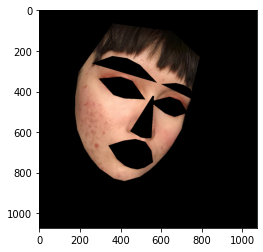

/content/gdrive/Shareddrives/CV/FinalCV/Detect_Acne.py:178: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  poly_s = np.array(poly_s).reshape(-1, 1, 2).astype(int)


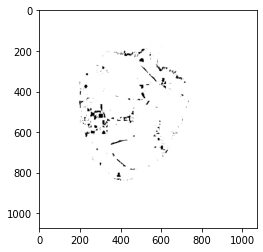

  0%|          | 0/300 [00:00<?, ?it/s]

tensor(0.1141, dtype=torch.float64)
tensor(0.0076, dtype=torch.float64)
tensor(0.0031, dtype=torch.float64)
tensor(0.0021, dtype=torch.float64)


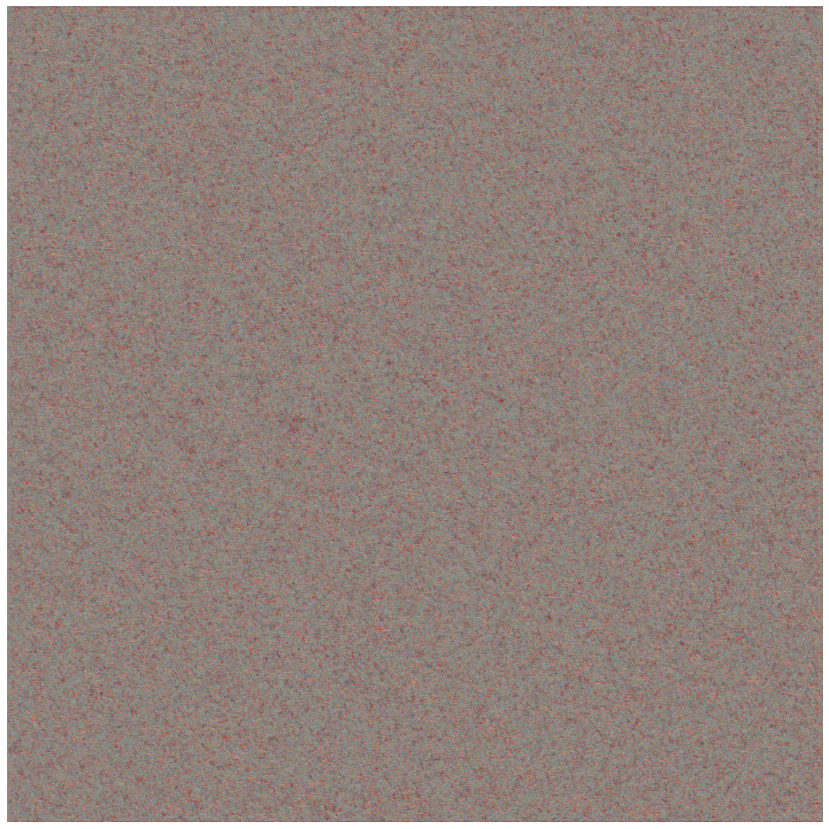

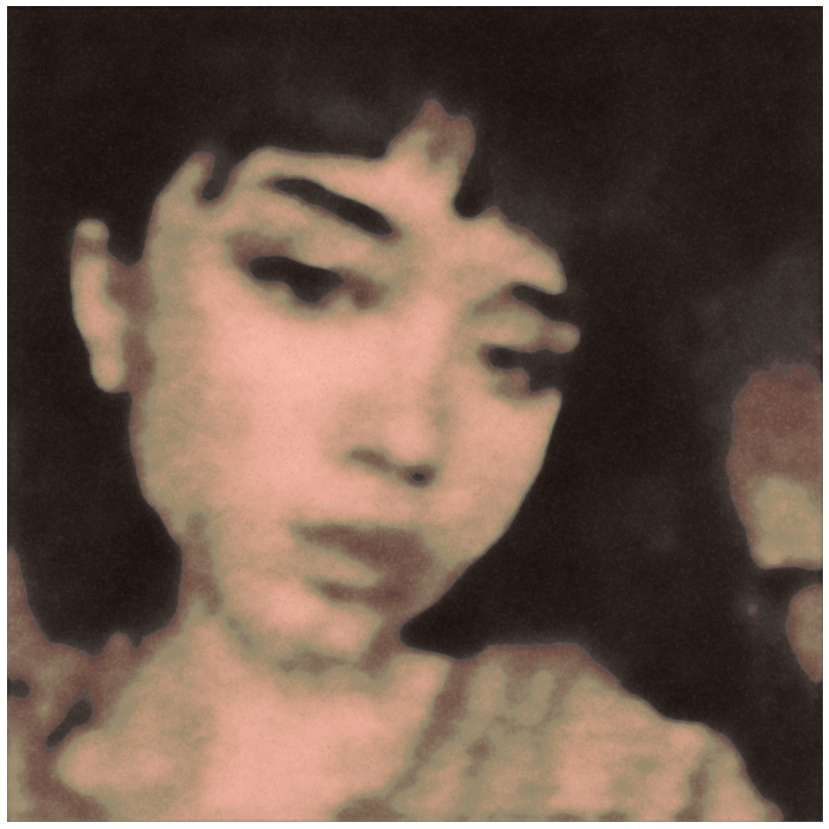

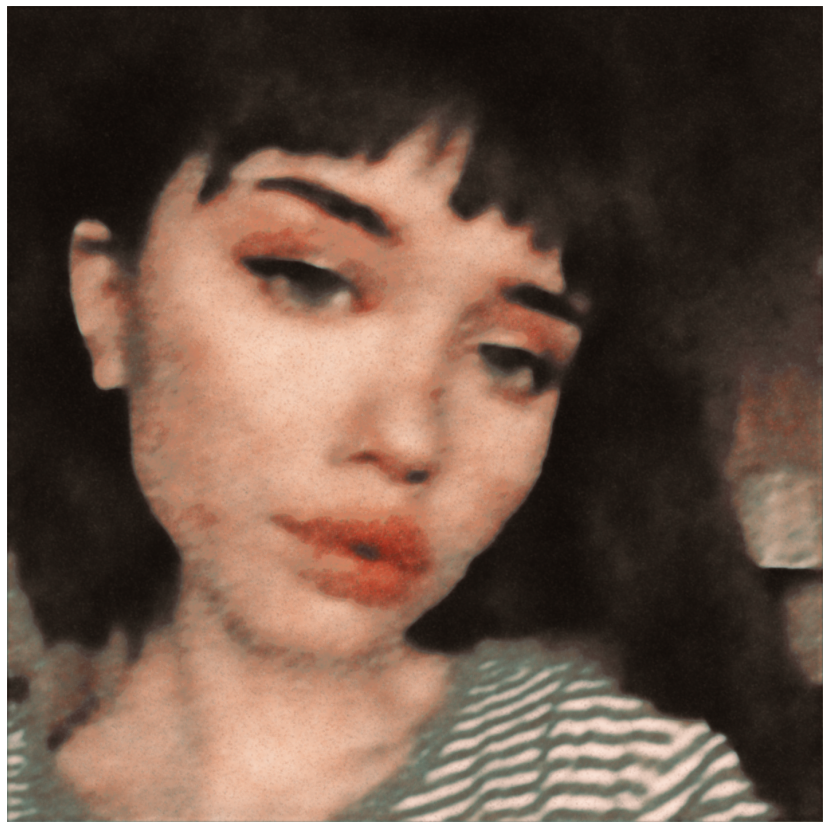

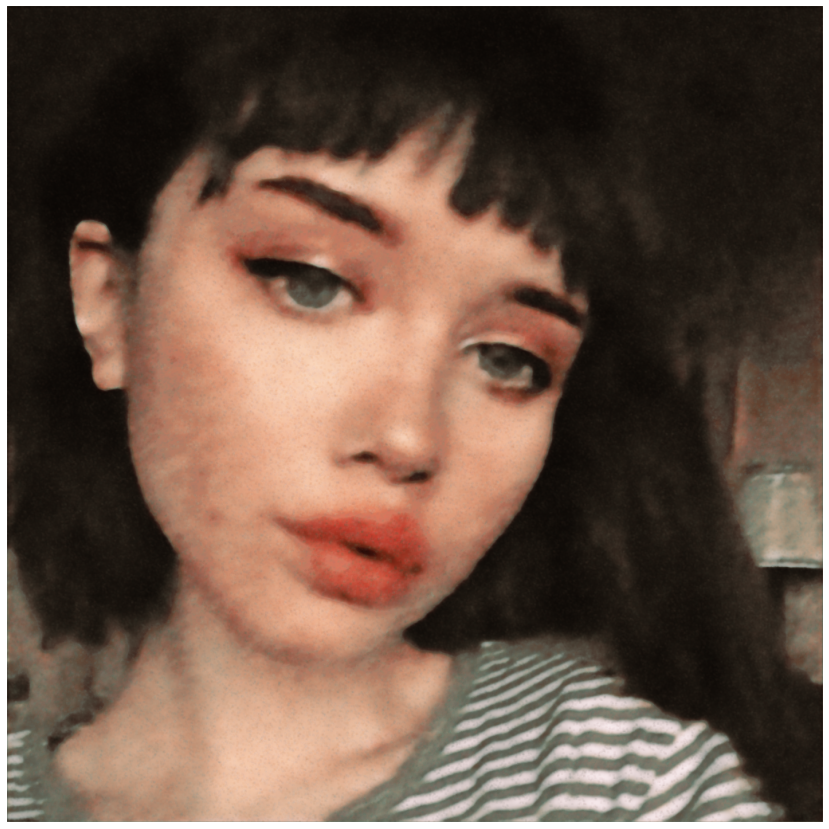

In [114]:
Origin_img = cv2.imread('data/t2.jpg')
mask = cv2.imread('data/kate_mask.jpg')
#showImage(mask)

img = Origin_img.copy()
    
img,Gimg = img2Gray(img)
    
face, landmarks = get_landmarks(Gimg)
faceMask = get_image_hull_mask(img, landmarks)
img = cv2.bitwise_and(faceMask, img)
showImage(img)

ad = Acne_Dector(img)
ad.run(method =1, debug=False)
showImage(ad.mask)
# Origin_img = imutils.resize(Origin_img, width=600)
# mask = cv2.imread("Data/kate_mask.png", cv2.IMREAD_GRAYSCALE)
# mask = cv2.cvtColor(ad.mask, cv2.COLOR_GRAY2BGR)
InputImage = Origin_img.copy()
# cut image, transform float type, Convert dimension [W x H x C] => [C x W x H]
Input = torch.from_numpy(crop_image(crop_image(InputImage/255).astype(float),16).transpose(2,0,1))
Input_mask = torch.from_numpy(crop_image((ad.mask/255).astype(float)).transpose(2,0,1)).unsqueeze(0)

white_mask = torch.from_numpy(np.ones_like(Input_mask)).cuda()

GenerateRandomInput = torch.Generator()
GenerateRandomInput.manual_seed(305)
RandomInput = torch.FloatTensor(Input.shape).uniform_(0, 1, generator=GenerateRandomInput)

# model = Unet(p=0.05).cuda() #
model = DeepImagePrior().cuda()
criterion = nn.MSELoss()
lr = 5e-3
opt = torch.optim.Adam(model.parameters(), lr=lr)

def train(epochs, model, Input, Input_mask, RandomInput, optimizer, iter, verbose = True):
    global white_mask
    
    images = []
    
    for epoch in tqdm(range(1, epochs + 1)):
        model.train()
        Input = Input.cuda()
        Input_mask = Input_mask.cuda()
        out_image = model(RandomInput[None, ...].cuda())
        # print(Input.shape)
        loss = criterion((out_image * Input_mask[None,...]), (Input[None,...] * Input_mask[None,...]))
                    
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if epoch%iter == 0 or epoch == 1:
            if (verbose):
                print(loss.data.cpu())
            model.eval()
            predict = out_image
            images.append(predict.detach().cpu().reshape(Input.shape))


    return predict, images


kate_impainting, kate_images = train(300, model, Input, Input_mask, RandomInput, opt, 100)

for i in range(len(kate_images)):
    imshow([kate_images[i].detach().cpu().reshape(Input.shape)])

  0%|          | 0/300 [00:00<?, ?it/s]

tensor(0.0020, dtype=torch.float64)
tensor(0.0017, dtype=torch.float64)
tensor(0.0015, dtype=torch.float64)
tensor(0.0013, dtype=torch.float64)


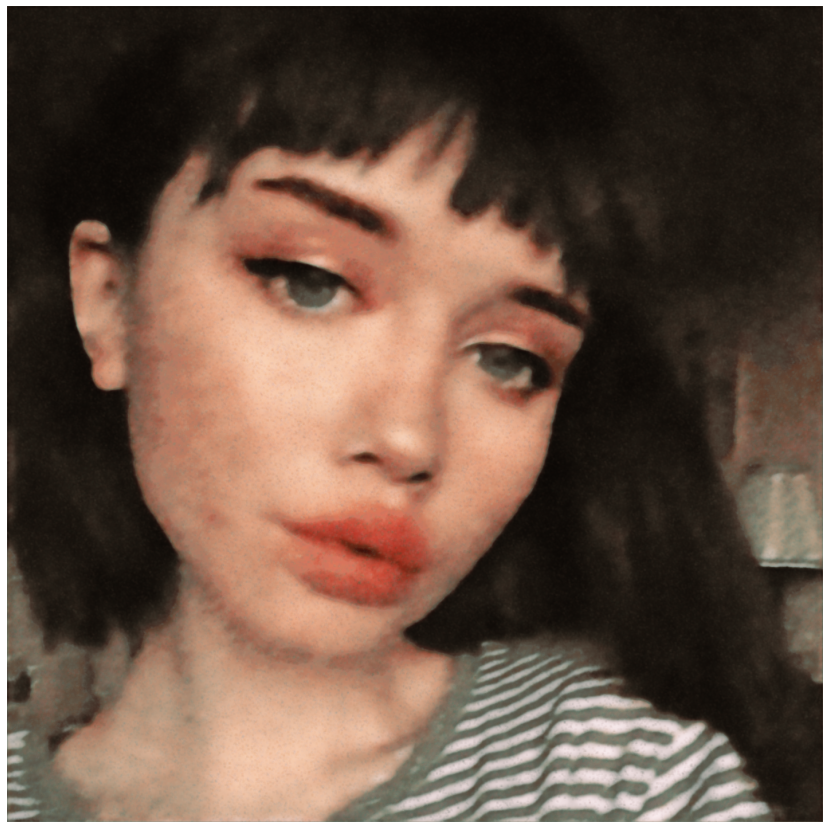

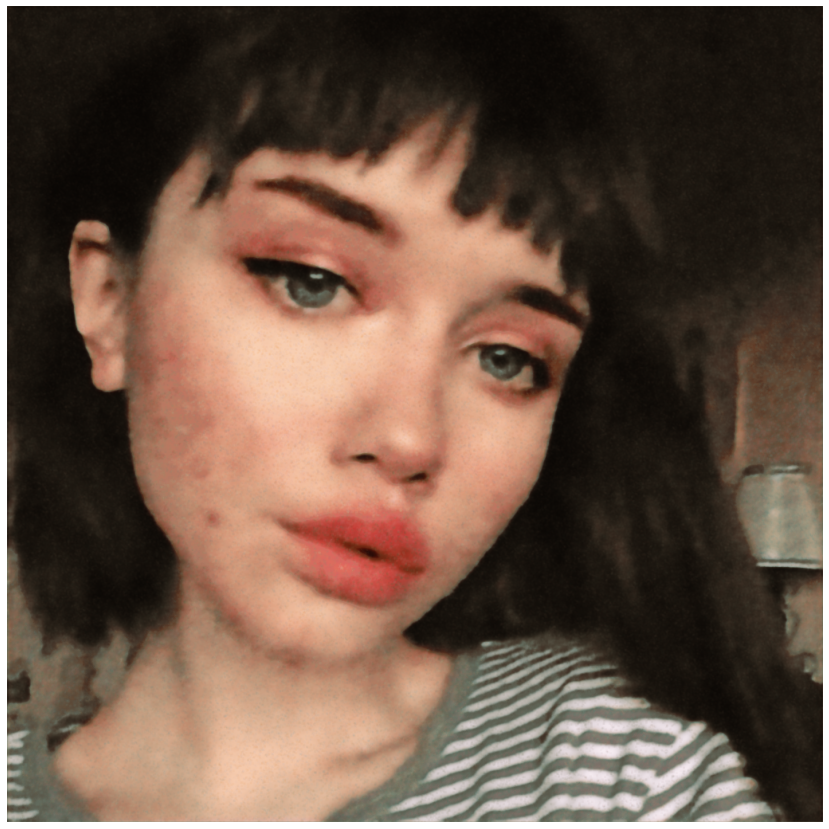

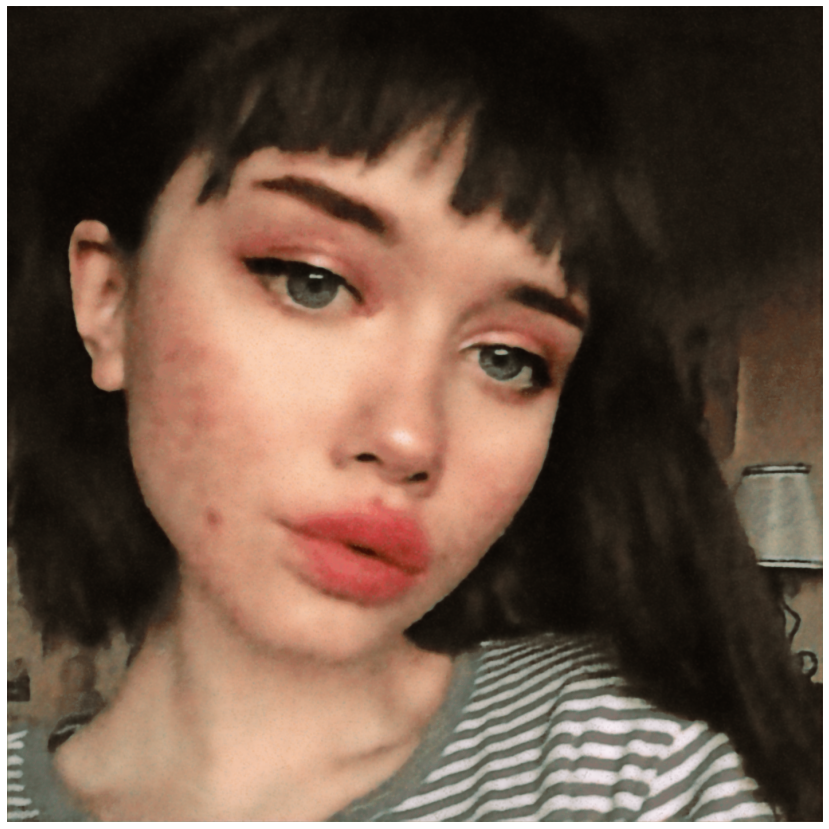

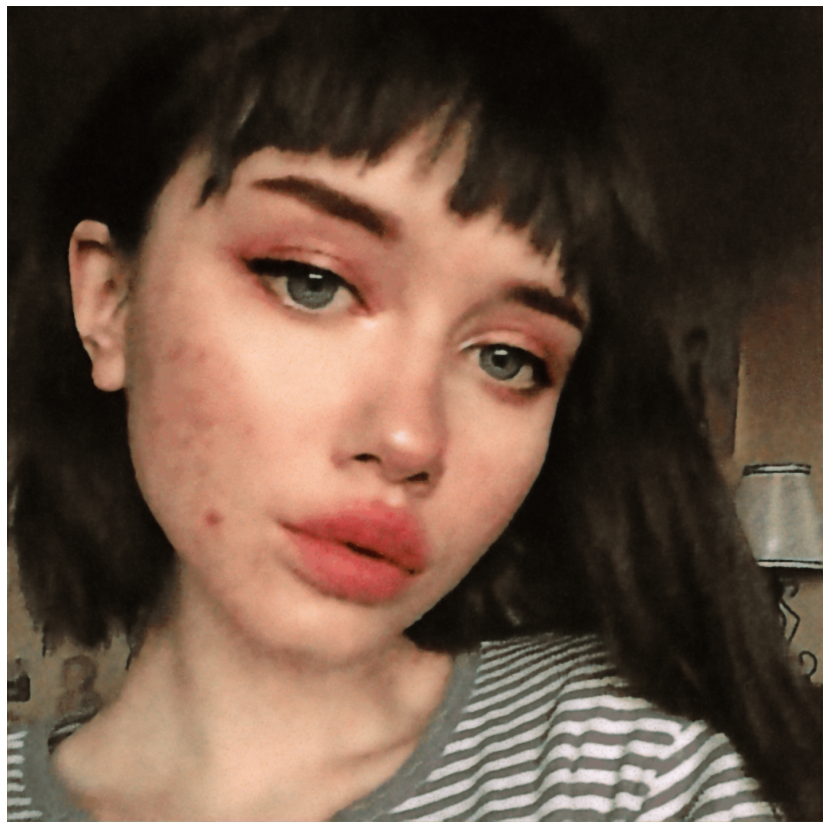

In [115]:
kate_impainting, kate_images = train(300, model, Input, Input_mask, RandomInput, opt, 100)

for i in range(len(kate_images)):
    imshow([kate_images[i].detach().cpu().reshape(Input.shape)])

True

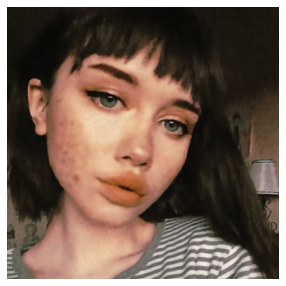

In [110]:
imshow([kate_impainting[-1].detach().cpu().reshape(Input.shape)])
img_for_save = np.transpose(kate_images[-1].detach().cpu().reshape(Input.shape).numpy(), (1, 2, 0))*255
cv2.imwrite('prior.jpg', np.uint8(img_for_save))